# **Discriminant analysis for revealing neuronal tendencies captured by sensitivity values**

## Navigation

- [**Basic imports and initialization**](#Basic-imports-and-initialization)
- [**1. ViT-b-16**](#1.-ViT-b-16)
- [**2. Swin-t**](#2.-Swin-t)
- [**3. MaxViT-t**](#3.-MaxViT-t)

## Basic imports and initialization

$\qquad$ [[Back to top]](#Navigation) $\qquad$ [[Next part $\to$]](#1.-ViT-b-16)

- [Limiting the hardware resources, importing packages](#Limiting-the-hardware-resources,-importing-packages)
- [Initializing common variables](#Initializing-common-variables)

In [1]:
notebook_directory_offset = '../'

### Limiting the hardware resources, importing packages

$\quad$[[Back to section]](#Basic-imports-and-initialization)$\quad$[[Next subsect.$\to$]](#Initializing-common-variables)

To provide easy access to modules stored in the ```../src/``` directory, we use the following workaround:

In [2]:
import os
import sys
sys.path.append(
    os.path.join(notebook_directory_offset, '../src/')
)

Next, we limit the hardware usage:

In [3]:
# set limitations on hardware
import hardware_setup
hardware_setup.mkl_set_num_threads(num_threads=4)

[mkl]: set up num_threads=4/4


Then we import all necessary packages:

In [4]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import sensitivity_analysis.preprocess_visualize
import sensitivity_analysis.augmentation_setting

import discriminant_analysis.compute
import discriminant_analysis.plot

import prediction.compute

import preparation.single_unit
import preparation.visualize

import data_loader.utils

### Initializing common variables

[[$\leftarrow$Prev.subsect.]](#Limiting-the-hardware-resources,-importing-packages)$\quad$[[Back to section]](#Basic-imports-and-initialization)$\quad$

In [5]:
dataset_name = 'imagenet'
data_dirname = f'../data/{dataset_name}'
activations_dirname = '../results/'
model_dirname = '../torch-models/'
exp_relative_path = '../experiments/'

values_fnm_base = f'{dataset_name}_values'
augmentation_set_numbers_list = (1, 2)

In [6]:
values_names_list = (
    'rbscc (train)',
    'rbscc (valid)',
    'shpv',
    'si',
    'siT'
)
values_names_list_2 = (
    'shpv',
    'si',
    'siT'
)

values_cov_pairs_dict = {
    'shpv': 'shptv',
    'si': 'sitv',
    'siT': 'sitv'
}
cov_values_names_dict = {
    'sitv': ('var', 'mean'),
    'shptv': ('var', 'mean'),
    #'sitv': 'var',
    #'shptv': 'var',
}
cov_values_funcs = {
    'sitv': {
        'mean': None,
        'var': None,
        ('var', 'mean'): lambda x: sensitivity_analysis.preprocess_visualize.compute_coef_var(x, log=False),
    },
    'shptv': {
        'means': None,
        'var': None,
        ('var', 'mean'): lambda x: sensitivity_analysis.preprocess_visualize.compute_coef_var(x, log=False),
    }
}


shpv_group_indices_dict = {}
for augmentation_set_number in augmentation_set_numbers_list:
    shpv_group_indices_dict[
        augmentation_set_number
    ] = sensitivity_analysis.augmentation_setting.get_group_variables_indices(
        augmentation_set_number,
        use_permutation_variable=True,
        use_class_variable=True,
        use_partition_variable=True
    )

values_names = ('shpv', 'si', 'siT')

In [7]:
#corr_type = 'pearson'
corr_type = 'spearman'

show = True
plot_colorbar = True

figsize_lda = (20, 8)
figsize_corr_hist = (20, 3)
figsize_corr_consolidated = (18, 4)

cmap_corr = 'RdBu_r'
cmap_corr_consolidated = 'twilight'
color_cumul = 'salmon'
color_bins = 'firebrick'
cmap_cross_corr_consolidated = 'twilight_shifted'
cmap_cvs_consolidated = 'twilight_shifted_r'

figsize_cross_corr = (14, 6)
figsize_cross_corr_hist = (12, 3)
figsize_cross_corr_consolidated = (18, 4)

figsize_cvs_corr = (25, 4)
figsize_cvs_consolidated = (25, 4)

## 1. ViT-b-16

[[$\leftarrow$ Prev.part]](#Basic-imports-and-initialization) $\qquad$ [[Back to top]](#Navigation) $\qquad$ [[Next part $\to$]](#2.-Swin-t)

- [1.1 Setting up the configuration variables](#1.1-Setting-up-the-configuration-variables)
- [1.2 2D LDA projections](#1.2-2D-LDA-projections)
- [1.3 LDA confusion matrices](#1.3-LDA-confusion-matrices)

### 1.1 Setting up the configuration variables

$\quad$ [[Back to section]](#1.-ViT-b-16)$\quad$[[Next subsect.$\to$]](#1.2-2D-LDA-projections)

In [22]:
vitb16_network_name = 'vit_b_16'
vitb16_network_modules = [
    'encoder.layers.encoder_layer_2',
    'encoder.layers.encoder_layer_5',
    'encoder.layers.encoder_layer_8',
    'encoder.layers.encoder_layer_11',
    'heads'
]

vitb16_values_fnms_dict = preparation.single_unit.extract_massive_values_fnms(
    vitb16_network_name,
    values_fnm_base,
    augmentation_set_numbers_list,
    prefix=None
);

vitb16_n_non_fc_modules = len(
    list(
        filter(
            lambda x: not (
                ('heads' in x)
                or ('head' in x)
            ),
            vitb16_network_modules
        )
    )
)

In [23]:
vitb16_sensitivity_values_dict = {}
vitb16_sensitivity_values_ctx_dict = {}
for val_name in values_names:
    cvalues = prediction.compute.get_all_values(
        vitb16_values_fnms_dict,
        os.path.join(notebook_directory_offset, activations_dirname),
        vitb16_network_modules,
        val_name,
        augmentation_set_numbers_list,
        shpv_group_indices_dict,
        extract_auxilliary_names=True,
    )
    cvalues_ctx = {}
    for i, module_name in enumerate(vitb16_network_modules):
        if i >= vitb16_n_non_fc_modules:
            cvalues_ctx[module_name] = cvalues[module_name]
            continue
        cvalues_ctx[module_name] = cvalues[module_name][:, 0, :]
        cvalues[module_name] = np.transpose(
            cvalues[module_name][:, 1:, :], (0, 2, 1) # remove cls + transpose
        )
        
    vitb16_sensitivity_values_dict[val_name] = cvalues
    vitb16_sensitivity_values_ctx_dict[val_name] = cvalues_ctx

### 1.2 2D LDA projections

[[$\leftarrow$Prev.subsect.]](#1.1-Setting-up-the-configuration-variables)$\quad$[[Back to section]](#1.-ViT-b-16)$\quad$[[Next subsect.$\to$]](#1.3-LDA-confusion-matrices)

In [24]:
vitb16_projected_sensitivity_values_dict = (
    discriminant_analysis.compute.project_2d_lda(
        vitb16_sensitivity_values_dict,
        vitb16_network_modules,
        augmentation_set_numbers_list,
        values_names,
        vitb16_n_non_fc_modules,
        extract_auxilliary_names=True,
    )
)

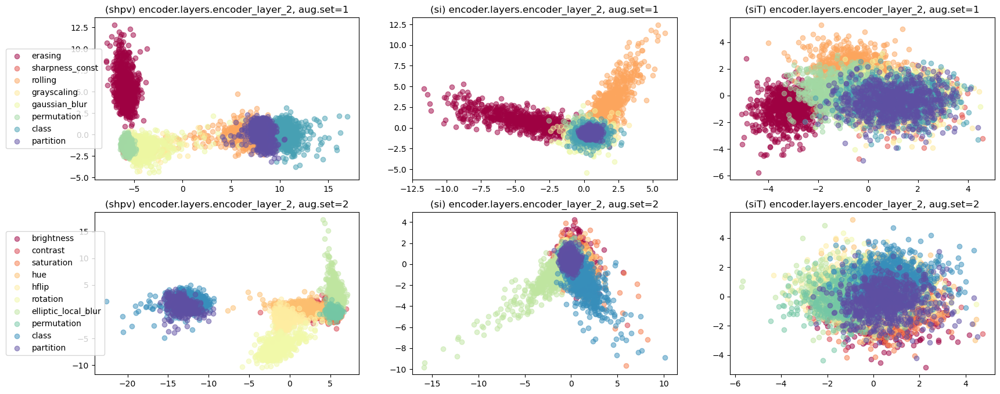

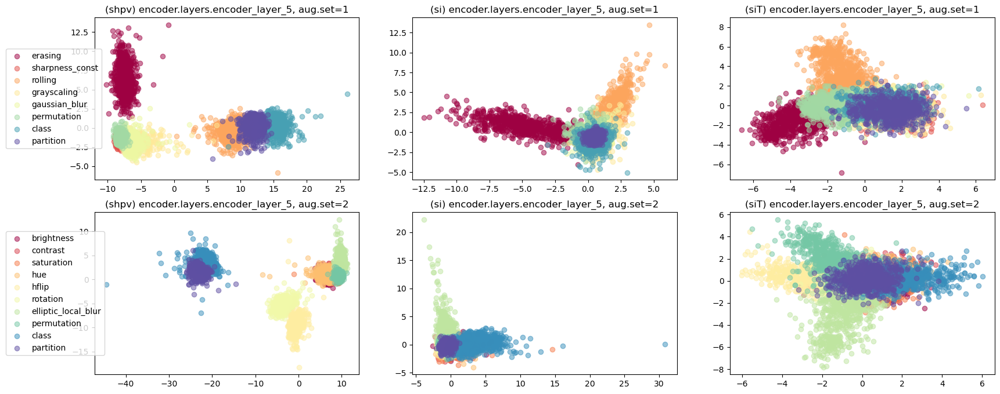

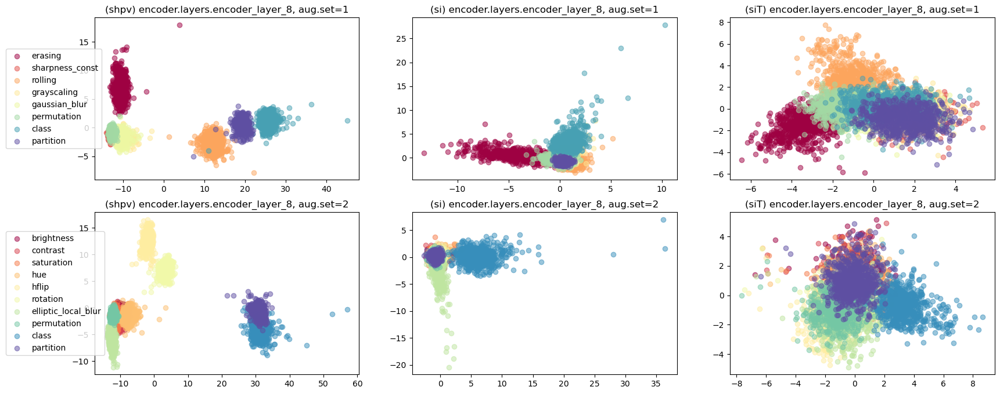

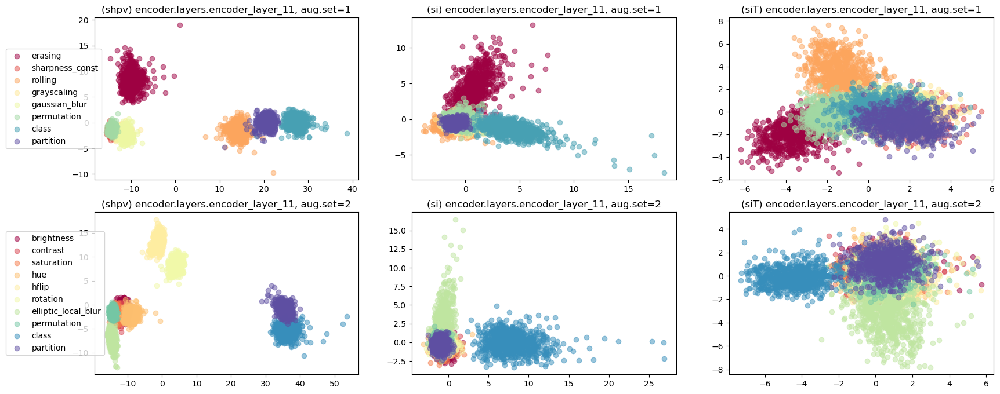

In [25]:
discriminant_analysis.plot.plot_lda_2d_projections_and_hists(
    vitb16_projected_sensitivity_values_dict,
    vitb16_sensitivity_values_dict,
    vitb16_network_modules[:vitb16_n_non_fc_modules],
    augmentation_set_numbers_list,
    values_names,
    vitb16_n_non_fc_modules,
    extract_auxilliary_names=True,
    figsize=figsize_lda,
    cmap='Spectral',
    show=True,
    alpha=0.5,
)

In [26]:
vitb16_projected_sensitivity_values_ctx_dict = (
    discriminant_analysis.compute.project_2d_lda(
        vitb16_sensitivity_values_ctx_dict,
        vitb16_network_modules,
        augmentation_set_numbers_list,
        values_names,
        0,
        extract_auxilliary_names=True,
    )
)

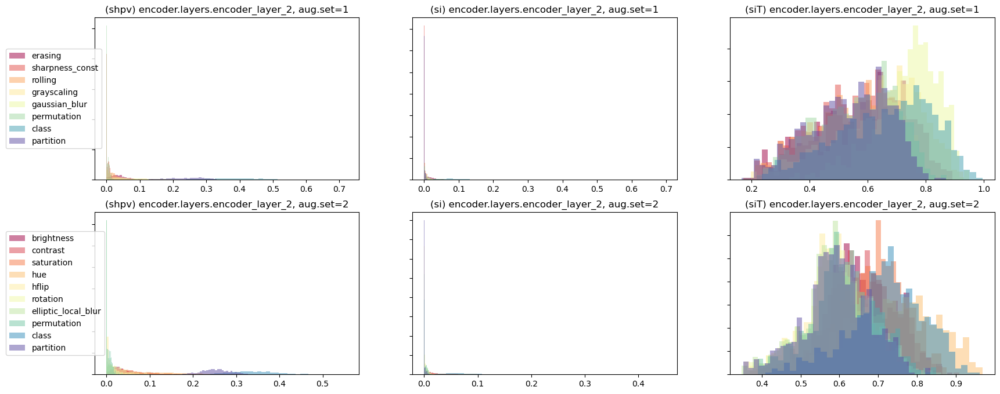

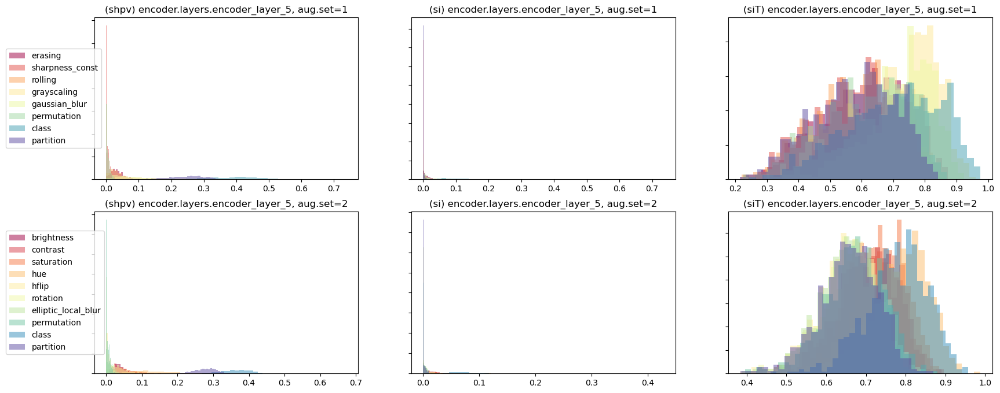

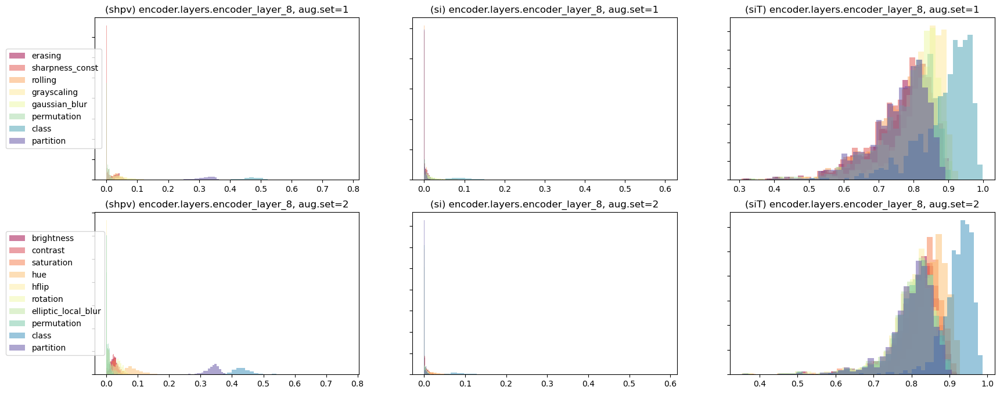

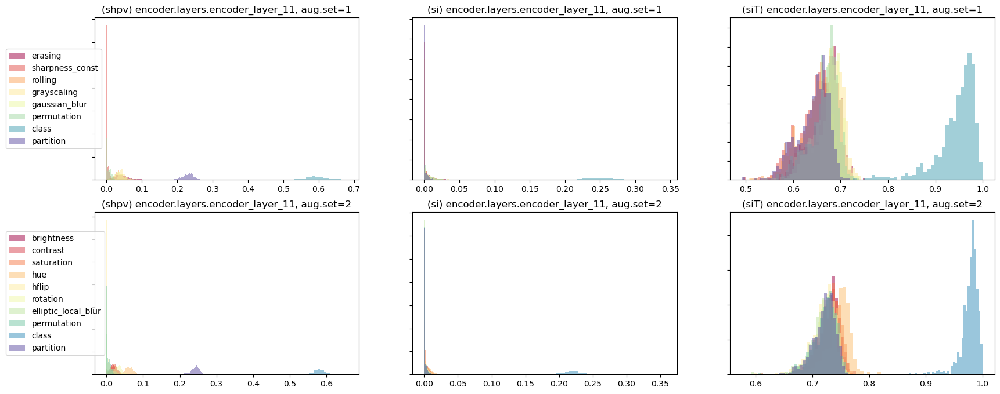

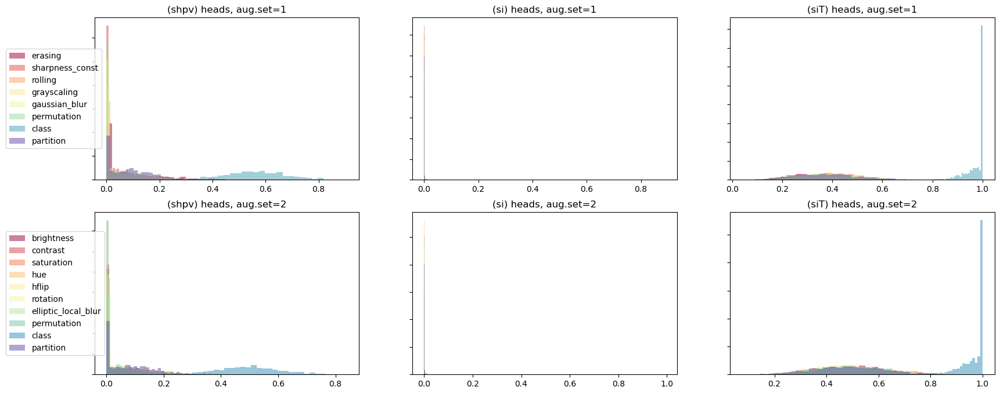

In [27]:
discriminant_analysis.plot.plot_lda_2d_projections_and_hists(
    vitb16_projected_sensitivity_values_ctx_dict,
    vitb16_sensitivity_values_ctx_dict,
    vitb16_network_modules,
    augmentation_set_numbers_list,
    values_names,
    0,
    extract_auxilliary_names=True,
    figsize=figsize_lda,
    cmap='Spectral',
    show=True,
    alpha=0.5,
)

### 1.3 LDA confusion matrices

[[$\leftarrow$Prev.subsect.]](#1.2-2D-LDA-projections)$\quad$[[Back to section]](#1.-ViT-b-16)$\quad$

In [28]:
vitb16_conf_mat_dict, vitb16_conf_mat_std_dict, vitb16_acc_dict = (
    discriminant_analysis.compute.compute_mean_valid_confusion_matrices(
        vitb16_sensitivity_values_dict,
        vitb16_network_modules,
        augmentation_set_numbers_list,
        values_names,
        vitb16_n_non_fc_modules,
        repeated_kfold_n_splits=5,
        repeated_kfold_n_repeats=100,
        random_state=0,
        extract_auxilliary_names=True,
    )
)

In [29]:
vitb16_cmacc_filename = 'lda_vitb16_imagenet_conf_mat_acc_no_ctx.pkl'
vitb16_cmacc_save_path = os.path.join(
     notebook_directory_offset, activations_dirname, vitb16_cmacc_filename
)

In [30]:
data_loader.utils.save_pickled_data(
    {
        'vitb16_conf_mat_dict': vitb16_conf_mat_dict,
        'vitb16_conf_mat_std_dict': vitb16_conf_mat_std_dict,
        'vitb16_acc_dict': vitb16_acc_dict,
    },
    vitb16_cmacc_save_path
)

In [13]:
tmp = data_loader.utils.load_pickled_data(vitb16_cmacc_save_path)
vitb16_conf_mat_dict = tmp['vitb16_conf_mat_dict']
vitb16_conf_mat_std_dict = tmp['vitb16_conf_mat_std_dict']
vitb16_acc_dict = tmp['vitb16_acc_dict']

In [31]:
vitb16_conf_mat_dict_shorten = dict()
vitb16_conf_mat_std_dict_shorten = dict()
vitb16_acc_dict_shorten = dict()
shorten_vitb16_network_modules = []
for sens_val_name in values_names:
    tmp_cm = dict()
    tmp_cm_std = dict()
    tmp_acc = dict()
    for i, module_name in enumerate(vitb16_network_modules):
        if i == vitb16_n_non_fc_modules:
            break
        #print(sens_val_name, module_name, subvals)
        shorten_module_name = module_name.split('.')[-1]
        if len(shorten_vitb16_network_modules) < vitb16_n_non_fc_modules:
            shorten_vitb16_network_modules.append(shorten_module_name)
        tmp_cm[shorten_module_name] = vitb16_conf_mat_dict[sens_val_name][module_name]
        tmp_cm_std[shorten_module_name] = vitb16_conf_mat_std_dict[sens_val_name][module_name]
        tmp_acc[shorten_module_name] = vitb16_acc_dict[sens_val_name][module_name]
    vitb16_conf_mat_dict_shorten[sens_val_name] = tmp_cm
    vitb16_conf_mat_std_dict_shorten[sens_val_name] = tmp_cm_std
    vitb16_acc_dict_shorten[sens_val_name] = tmp_acc


			encoder_layer_2



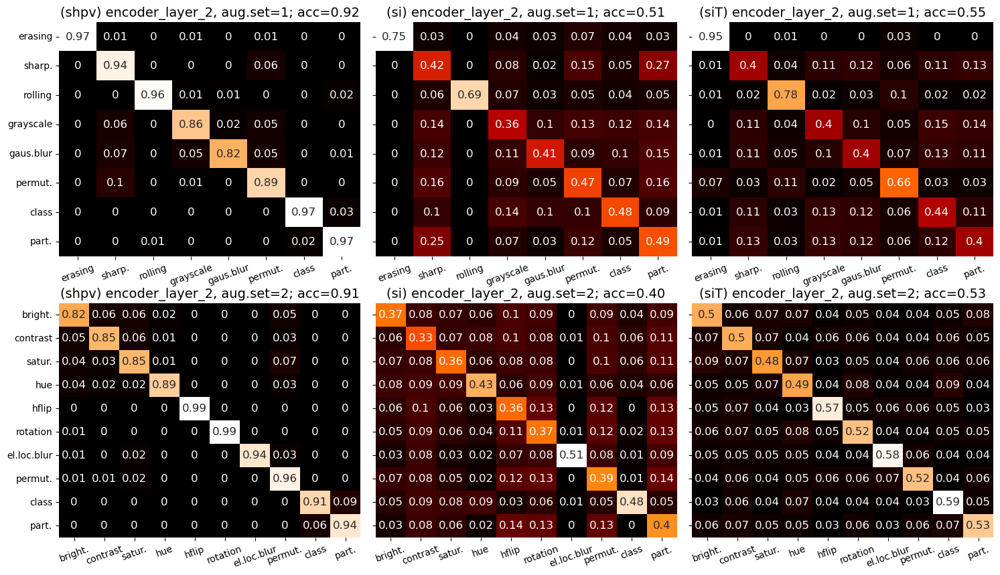


			encoder_layer_5



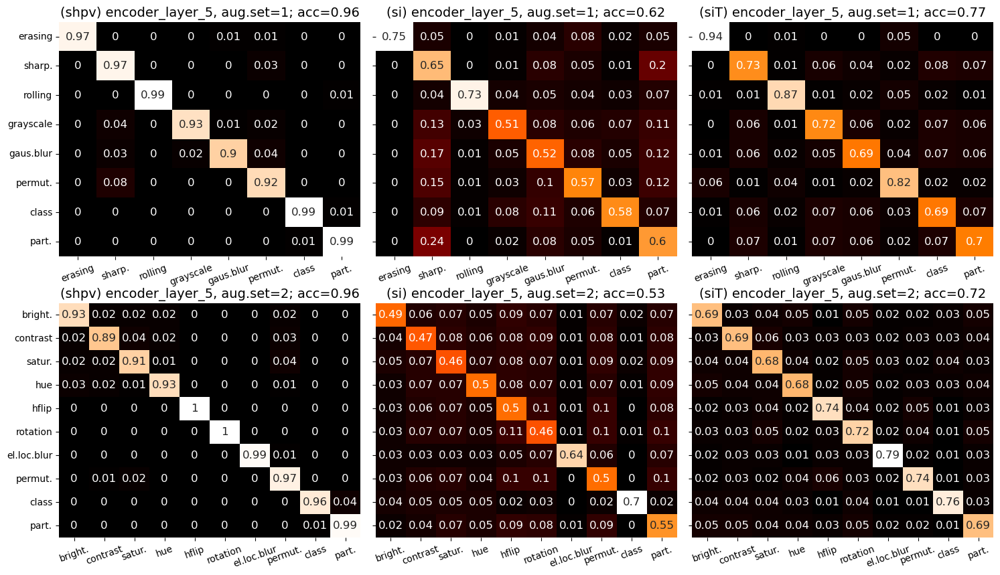


			encoder_layer_8



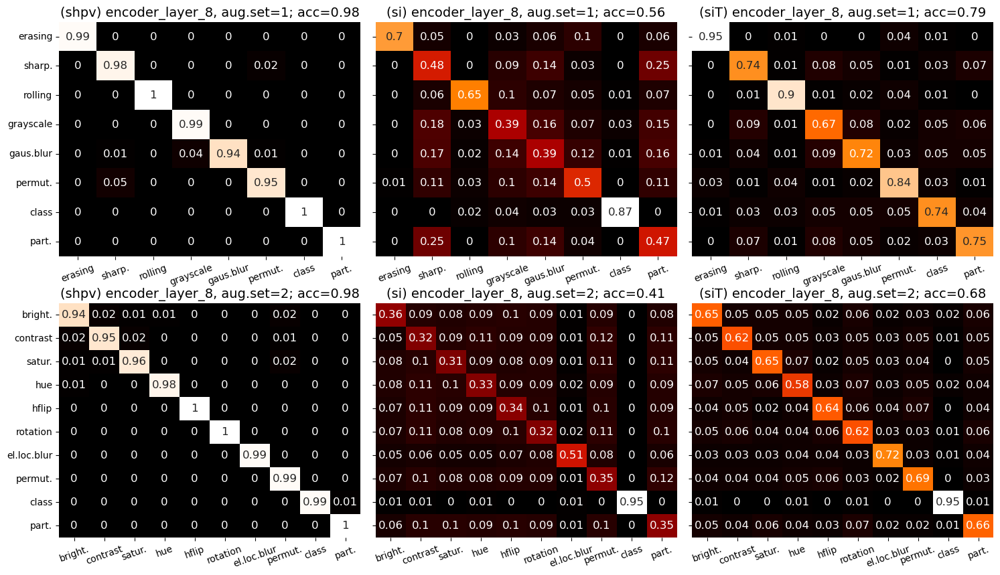


			encoder_layer_11



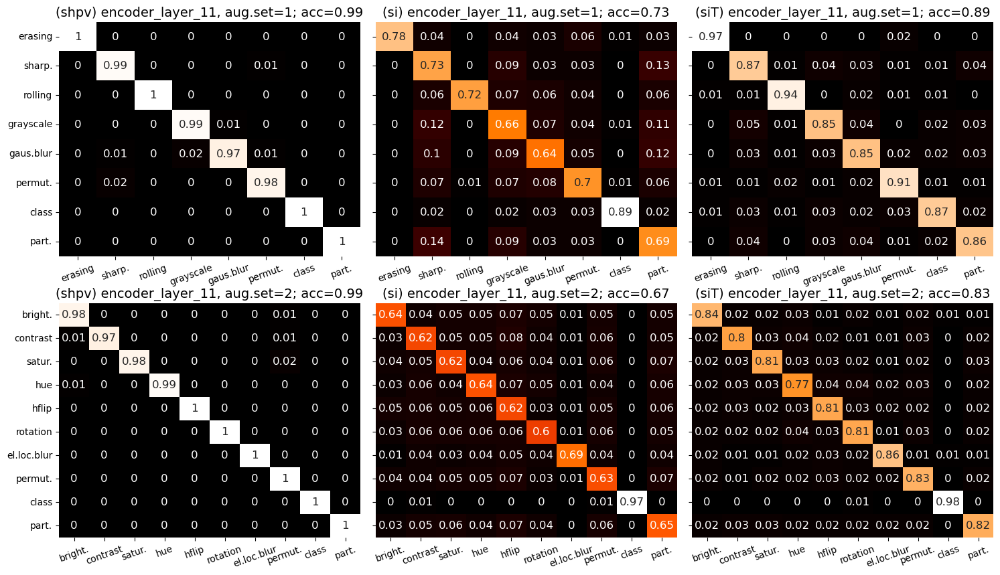

In [32]:
save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{vitb16_network_name}_{dataset_name}/lda_confmat/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'lda_confmat'

discriminant_analysis.plot.plot_confusion_matrices(
    vitb16_conf_mat_dict_shorten,
    vitb16_acc_dict_shorten,
    shorten_vitb16_network_modules,
    augmentation_set_numbers_list,
    values_names,
    vitb16_n_non_fc_modules,
    extract_auxilliary_names=True,
    which='valid',
    n_round=2,
    figsize=(18, 10),
    cmap='gist_heat',
    show=True,
    save_dirname=save_dirname,
    save_filename_base=save_filename_base,
    text_size=12,
    title_size=14
)


			encoder_layer_2



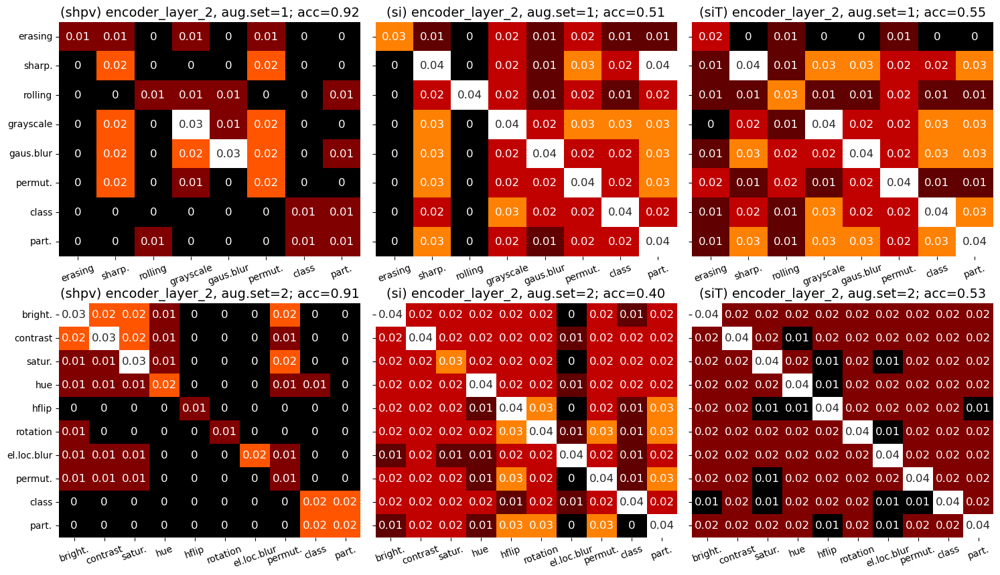


			encoder_layer_5



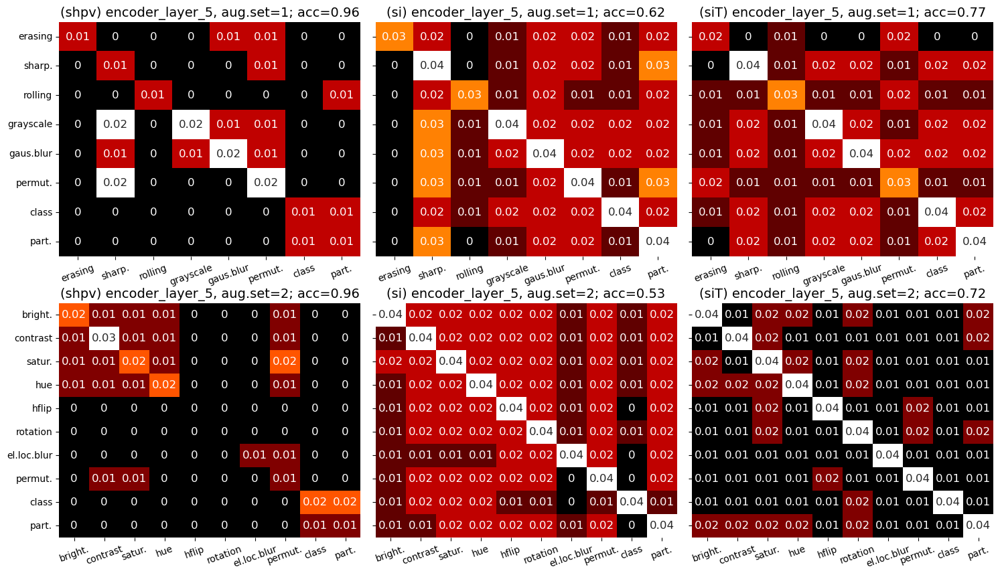


			encoder_layer_8



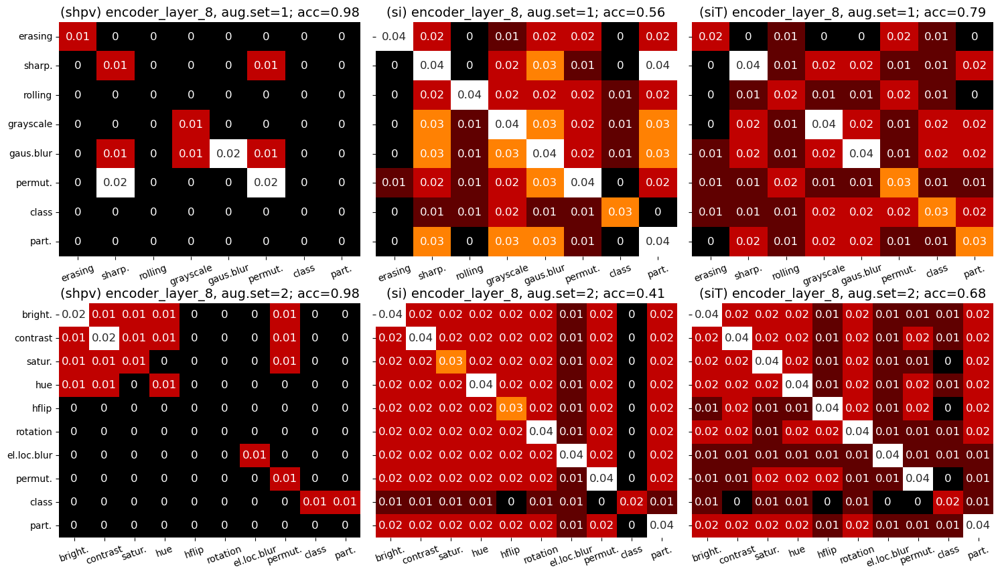


			encoder_layer_11



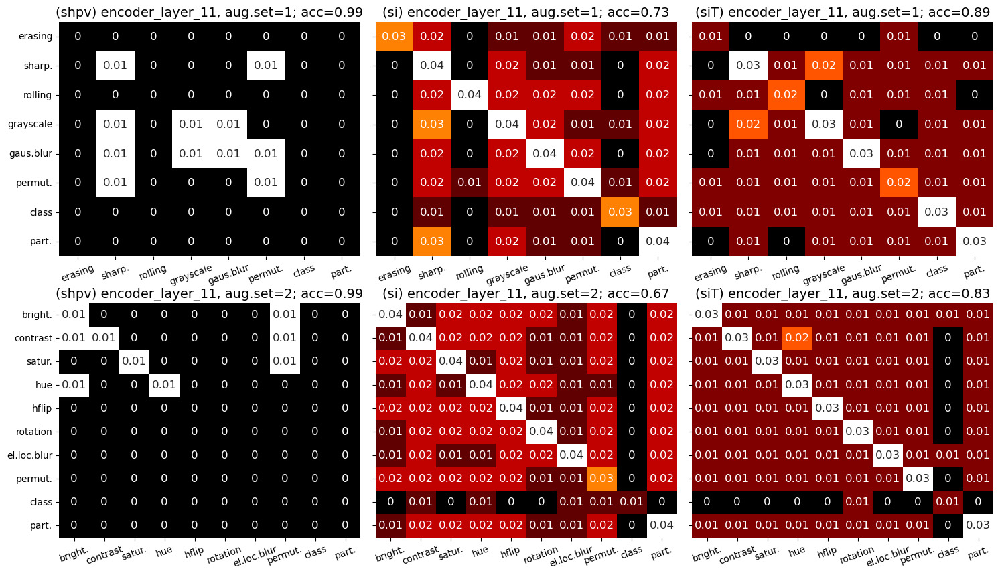

In [33]:
save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{vitb16_network_name}_{dataset_name}/lda_confmat_std/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'lda_confmat_std'

discriminant_analysis.plot.plot_confusion_matrices(
    vitb16_conf_mat_std_dict_shorten,
    vitb16_acc_dict_shorten,
    shorten_vitb16_network_modules,
    augmentation_set_numbers_list,
    values_names,
    vitb16_n_non_fc_modules,
    extract_auxilliary_names=True,
    which='valid',
    n_round=2,
    figsize=(18, 10),
    cmap='gist_heat',
    show=True,
    save_dirname=save_dirname,
    save_filename_base=save_filename_base,
    text_size=12,
    title_size=14
)

In [34]:
discriminant_analysis.compute.print_max_std_stats(
    vitb16_conf_mat_std_dict,
    vitb16_network_modules,
    values_names,
    augmentation_set_numbers_list,
    vitb16_n_non_fc_modules,
)

Sensitivity=shpv, module=encoder.layers.encoder_layer_2, aug.set=1, max(sigma)=0.030
Sensitivity=shpv, module=encoder.layers.encoder_layer_2, aug.set=2, max(sigma)=0.031
Sensitivity=shpv, module=encoder.layers.encoder_layer_5, aug.set=1, max(sigma)=0.024
Sensitivity=shpv, module=encoder.layers.encoder_layer_5, aug.set=2, max(sigma)=0.026
Sensitivity=shpv, module=encoder.layers.encoder_layer_8, aug.set=1, max(sigma)=0.018
Sensitivity=shpv, module=encoder.layers.encoder_layer_8, aug.set=2, max(sigma)=0.018
Sensitivity=shpv, module=encoder.layers.encoder_layer_11, aug.set=1, max(sigma)=0.013
Sensitivity=shpv, module=encoder.layers.encoder_layer_11, aug.set=2, max(sigma)=0.012
Sensitivity=shpv: 0.012 <= max(sigma) <= 0.031
Sensitivity=si, module=encoder.layers.encoder_layer_2, aug.set=1, max(sigma)=0.041
Sensitivity=si, module=encoder.layers.encoder_layer_2, aug.set=2, max(sigma)=0.041
Sensitivity=si, module=encoder.layers.encoder_layer_5, aug.set=1, max(sigma)=0.042
Sensitivity=si, module

## 2. Swin-t

[[$\leftarrow$ Prev.part]](#1.-ViT-b-16) $\qquad$ [[Back to top]](#Navigation) $\qquad$ [[Next part $\to$]](#3.-MaxViT-t)

- [2.1 Setting up the configuration variables](#2.1-Setting-up-the-configuration-variables)
- [2.2 2D LDA projections](#2.2-2D-LDA-projections)
- [2.3 LDA confusion matrices](#2.3-LDA-confusion-matrices)

### 2.1 Setting up the configuration variables

$\quad$ [[Back to section]](#2.-Swin-t)$\quad$[[Next subsect.$\to$]](#2.2-2D-LDA-projections)

In [35]:
swint_network_name = 'swin_t'
swint_network_modules = [
    'features.1',
    'features.3',
    'features.5',
    'features.7',
    'head'
]

swint_n_non_fc_modules = len(
    list(
        filter(
            lambda x: not (
                ('heads' in x)
                or ('head' in x)
            ),
            swint_network_modules
        )
    )
)

swint_values_fnms_dict = preparation.single_unit.extract_massive_values_fnms(
    swint_network_name,
    values_fnm_base,
    augmentation_set_numbers_list,
    prefix=None
);

In [36]:
swint_sensitivity_values_dict = {}
for val_name in values_names:
    cvalues = prediction.compute.get_all_values(
        swint_values_fnms_dict,
        os.path.join(notebook_directory_offset, activations_dirname),
        swint_network_modules,
        val_name,
        augmentation_set_numbers_list,
        shpv_group_indices_dict,
        extract_auxilliary_names=True,
    )
    for i, module_name in enumerate(swint_network_modules):
        if i >= swint_n_non_fc_modules:
            cvalues[module_name] = cvalues[module_name]
            continue
        cvalues[module_name] = np.transpose(
            cvalues[module_name][:, :, :, :], (0, 3, 1, 2) # transpose
        )
        cvalues[module_name] = np.reshape(cvalues[module_name], cvalues[module_name].shape[:2] + (-1, ))
        #print(cvalues[module_name].shape)
    swint_sensitivity_values_dict[val_name] = cvalues

### 2.2 2D LDA projections

[[$\leftarrow$Prev.subsect.]](#2.1-Setting-up-the-configuration-variables)$\quad$[[Back to section]](#2.-Swin-t)$\quad$[[Next subsect.$\to$]](#2.3-LDA-confusion-matrices)

In [37]:
swint_projected_sensitivity_values_dict = (
    discriminant_analysis.compute.project_2d_lda(
        swint_sensitivity_values_dict,
        swint_network_modules,
        augmentation_set_numbers_list,
        values_names,
        swint_n_non_fc_modules,
        extract_auxilliary_names=True,
    )
)

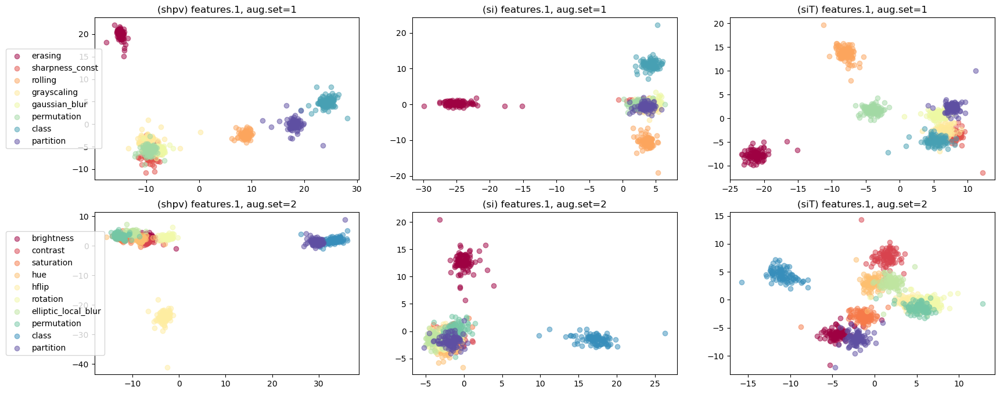

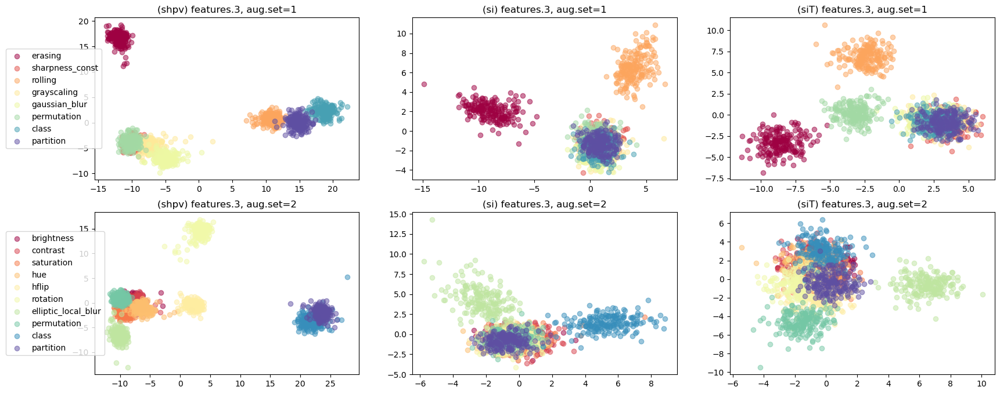

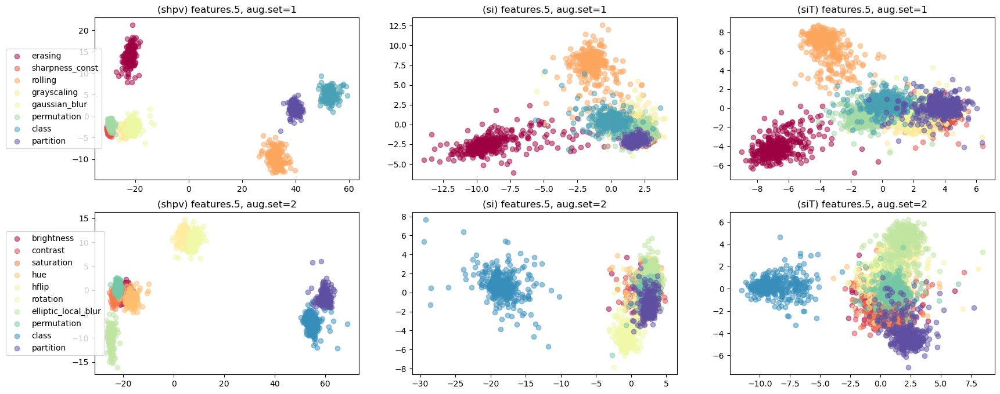

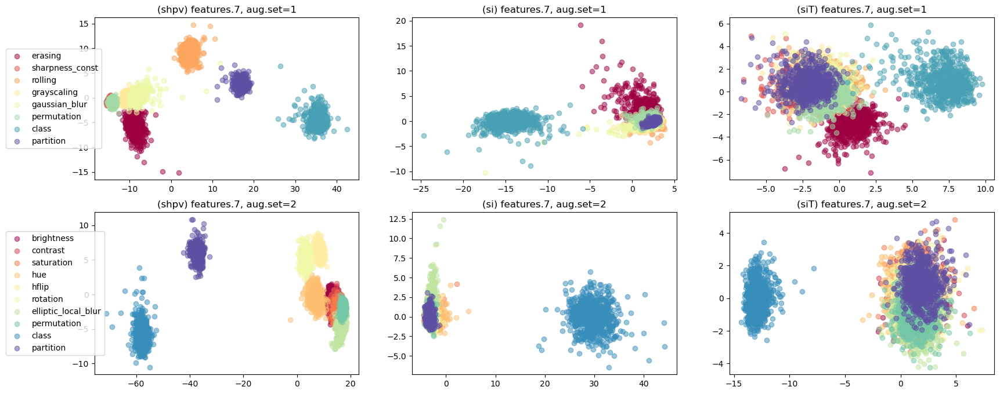

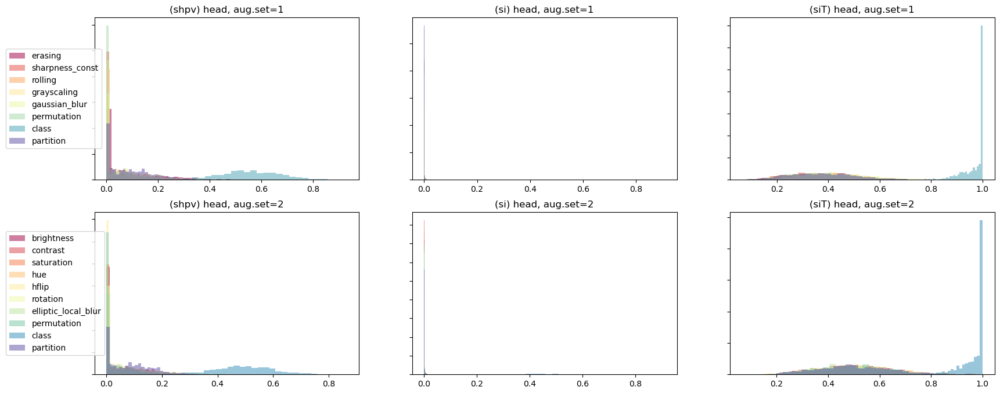

In [38]:
discriminant_analysis.plot.plot_lda_2d_projections_and_hists(
    swint_projected_sensitivity_values_dict,
    swint_sensitivity_values_dict,
    swint_network_modules,
    augmentation_set_numbers_list,
    values_names,
    swint_n_non_fc_modules,
    extract_auxilliary_names=True,
    figsize=figsize_lda,
    cmap='Spectral',
    show=True,
    alpha=0.5,
)

### 2.3 LDA confusion matrices

[[$\leftarrow$Prev.subsect.]](#2.2-2D-LDA-projections)$\quad$[[Back to section]](#2.-Swin-t)$\quad$

In [39]:
swint_conf_mat_dict, swint_conf_mat_std_dict, swint_acc_dict = (
    discriminant_analysis.compute.compute_mean_valid_confusion_matrices(
        swint_sensitivity_values_dict,
        swint_network_modules,
        augmentation_set_numbers_list,
        values_names,
        swint_n_non_fc_modules,
        repeated_kfold_n_splits=5,
        repeated_kfold_n_repeats=100,
        random_state=0,
        extract_auxilliary_names=True,
    )
)

In [40]:
swint_cmacc_filename = 'lda_swint_imagenet_conf_mat_acc.pkl'
swint_cmacc_save_path = os.path.join(
    notebook_directory_offset, activations_dirname, swint_cmacc_filename
)

In [41]:
data_loader.utils.save_pickled_data(
    {
        'swint_conf_mat_dict': swint_conf_mat_dict,
        'swint_conf_mat_std_dict': swint_conf_mat_std_dict,
        'swint_acc_dict': swint_acc_dict,
    },
    swint_cmacc_save_path
)

In [34]:
tmp = data_loader.utils.load_pickled_data(swint_cmacc_save_path)
swint_conf_mat_dict = tmp['swint_conf_mat_dict']
swint_conf_mat_std_dict = tmp['swint_conf_mat_std_dict']
swint_acc_dict = tmp['swint_acc_dict']


			features.1



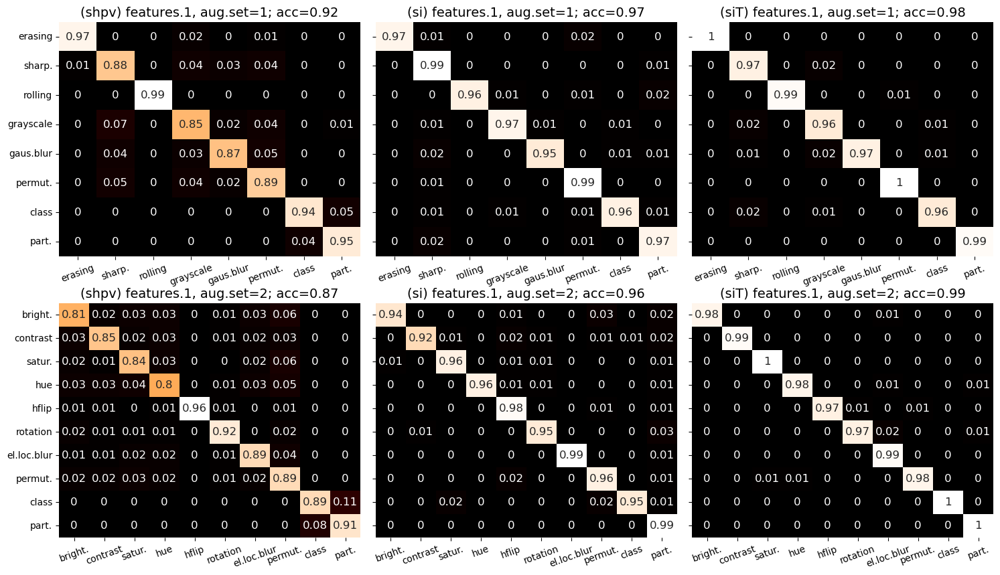


			features.3



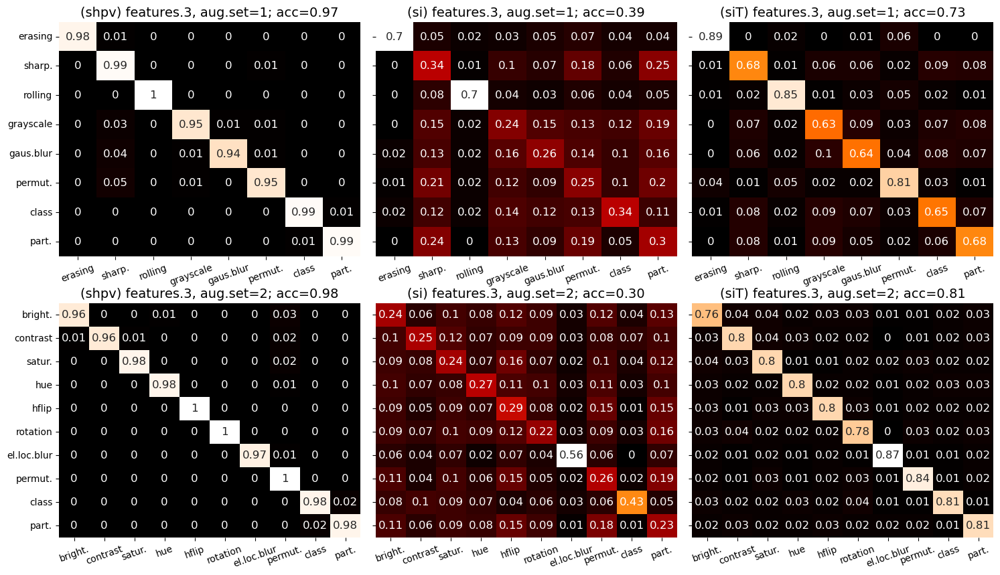


			features.5



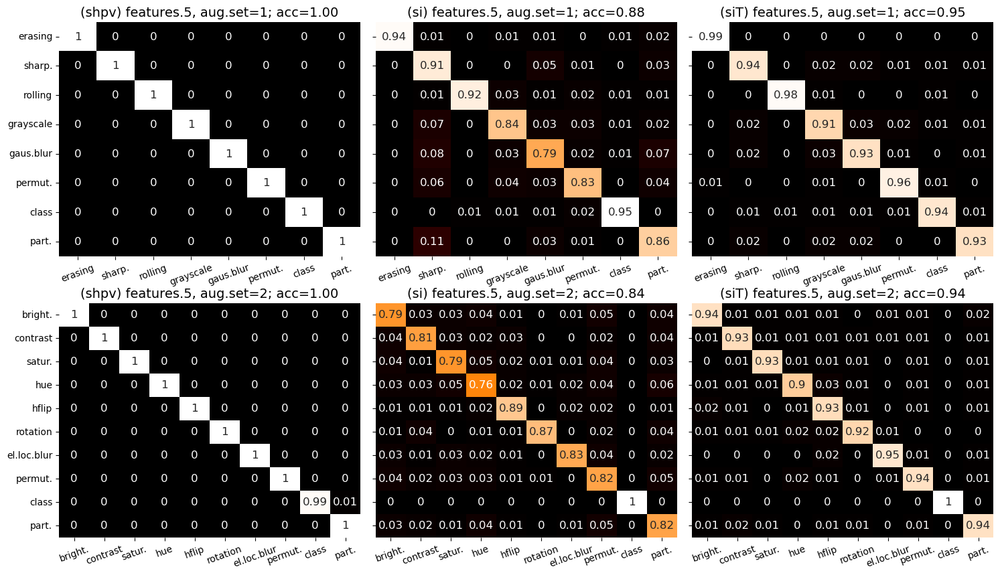


			features.7



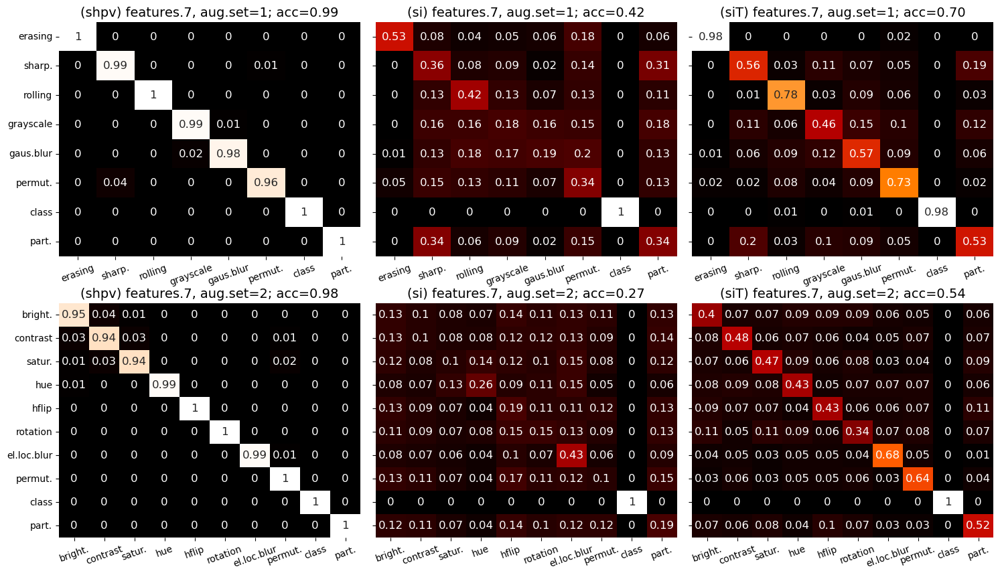

In [42]:
save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{swint_network_name}_{dataset_name}/lda_confmat/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'lda_confmat'

discriminant_analysis.plot.plot_confusion_matrices(
    swint_conf_mat_dict,
    swint_acc_dict,
    swint_network_modules,
    augmentation_set_numbers_list,
    values_names,
    swint_n_non_fc_modules,
    extract_auxilliary_names=True,
    which='valid',
    n_round=2,
    figsize=(18, 10),
    cmap='gist_heat',
    show=True,
    save_dirname=save_dirname,
    save_filename_base=save_filename_base,
    text_size=12,
    title_size=14
)


			features.1



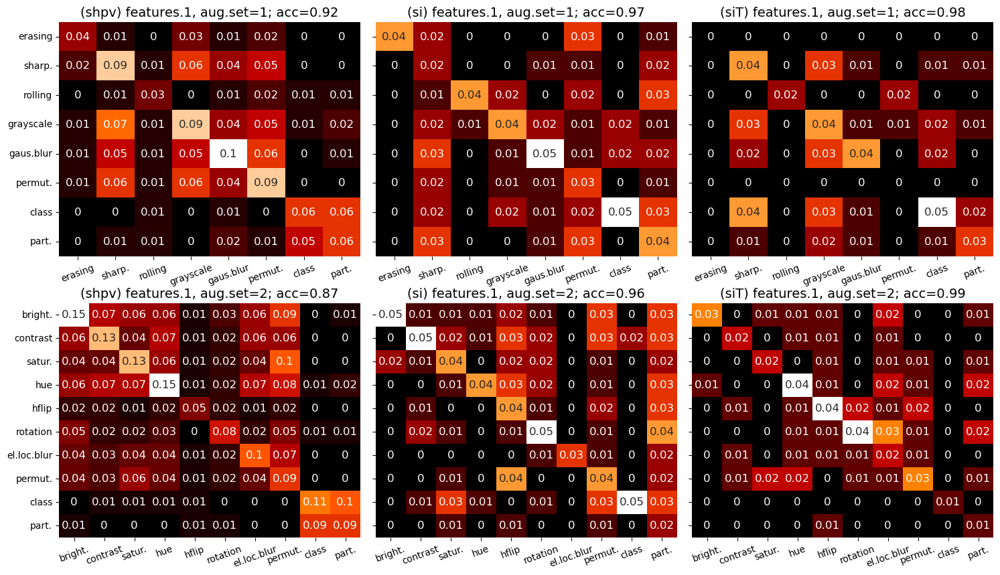


			features.3



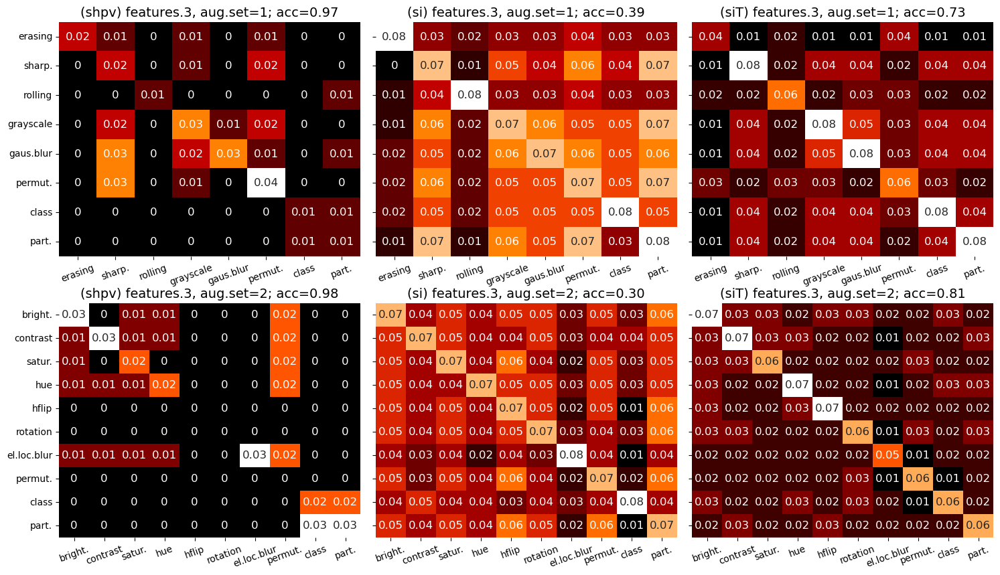


			features.5



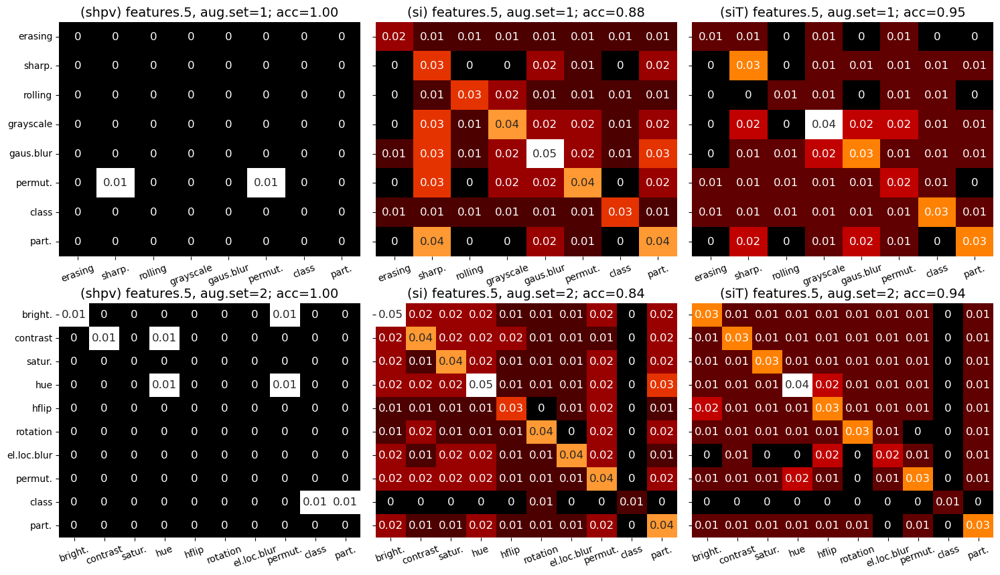


			features.7



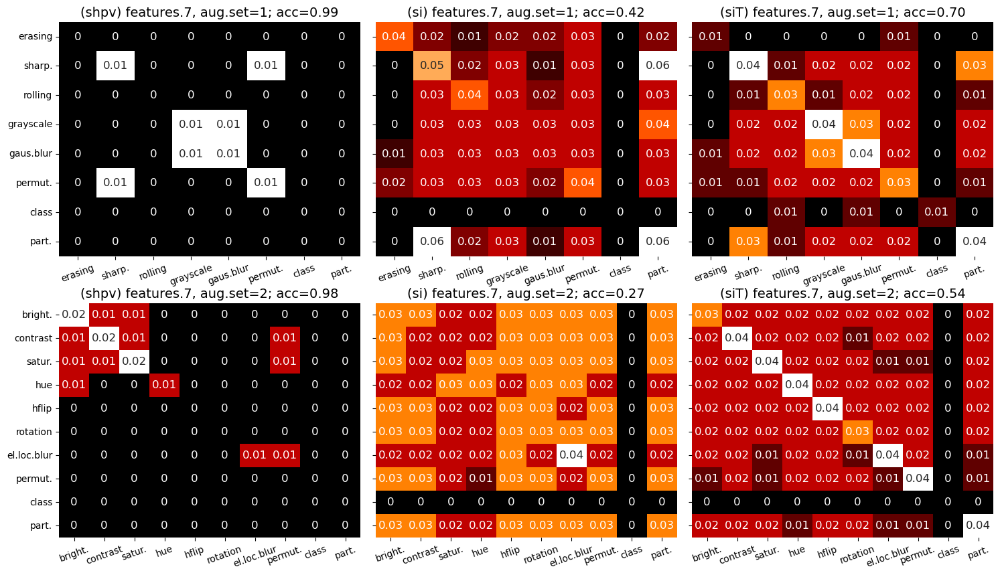

In [43]:
save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{swint_network_name}_{dataset_name}/lda_confmat_std/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'lda_confmat_std'

discriminant_analysis.plot.plot_confusion_matrices(
    swint_conf_mat_std_dict,
    swint_acc_dict,
    swint_network_modules,
    augmentation_set_numbers_list,
    values_names,
    swint_n_non_fc_modules,
    extract_auxilliary_names=True,
    which='valid',
    n_round=2,
    figsize=(18, 10),
    cmap='gist_heat',
    show=True,
    save_dirname=save_dirname,
    save_filename_base=save_filename_base,
    text_size=12,
    title_size=14
)

In [44]:
discriminant_analysis.compute.print_max_std_stats(
    swint_conf_mat_std_dict,
    swint_network_modules,
    values_names,
    augmentation_set_numbers_list,
    swint_n_non_fc_modules,
)

Sensitivity=shpv, module=features.1, aug.set=1, max(sigma)=0.097
Sensitivity=shpv, module=features.1, aug.set=2, max(sigma)=0.155
Sensitivity=shpv, module=features.3, aug.set=1, max(sigma)=0.038
Sensitivity=shpv, module=features.3, aug.set=2, max(sigma)=0.031
Sensitivity=shpv, module=features.5, aug.set=1, max(sigma)=0.007
Sensitivity=shpv, module=features.5, aug.set=2, max(sigma)=0.009
Sensitivity=shpv, module=features.7, aug.set=1, max(sigma)=0.014
Sensitivity=shpv, module=features.7, aug.set=2, max(sigma)=0.019
Sensitivity=shpv: 0.007 <= max(sigma) <= 0.155
Sensitivity=si, module=features.1, aug.set=1, max(sigma)=0.046
Sensitivity=si, module=features.1, aug.set=2, max(sigma)=0.054
Sensitivity=si, module=features.3, aug.set=1, max(sigma)=0.079
Sensitivity=si, module=features.3, aug.set=2, max(sigma)=0.080
Sensitivity=si, module=features.5, aug.set=1, max(sigma)=0.045
Sensitivity=si, module=features.5, aug.set=2, max(sigma)=0.049
Sensitivity=si, module=features.7, aug.set=1, max(sigma

## 3. MaxViT-t

[[$\leftarrow$ Prev.part]](#2.-Swin-t) $\qquad$ [[Back to top]](#Navigation)

- [3.1 Setting up the configuration variables](#3.1-Setting-up-the-configuration-variables)
- [3.2 2D LDA projections](#3.2-2D-LDA-projections)
- [3.3 LDA confusion matrices](#3.3-LDA-confusion-matrices)

### 3.1 Setting up the configuration variables

$\quad$ [[Back to section]](#3.-MaxViT-t)$\quad$[[Next subsect.$\to$]](#3.2-2D-LDA-projections)

In [8]:
maxvit_t_network_name = 'maxvit_t'
maxvit_t_network_modules = [
    'blocks.0',
    'blocks.1',
    'blocks.2',
    'blocks.3',
    'classifier'
]

maxvit_t_n_non_fc_modules = len(
    list(
        filter(
            lambda x: not (
                ('heads' in x)
                or ('head' in x)
                or ('classifier' in x)
            ),
            maxvit_t_network_modules
        )
    )
)

maxvit_t_values_fnms_dict = preparation.single_unit.extract_massive_values_fnms(
    maxvit_t_network_name,
    values_fnm_base,
    augmentation_set_numbers_list,
    prefix=None
);

In [12]:
maxvit_t_sensitivity_values_dict = {}
for val_name in values_names:
    cvalues = prediction.compute.get_all_values(
        maxvit_t_values_fnms_dict,
        os.path.join(notebook_directory_offset, activations_dirname),
        maxvit_t_network_modules,
        val_name,
        augmentation_set_numbers_list,
        shpv_group_indices_dict,
        extract_auxilliary_names=True,
    )
    maxvit_t_sensitivity_values_dict[val_name] = cvalues
    print([(x, y.shape) for x, y in cvalues.items()])

[('blocks.0', (18, 64, 56, 56)), ('blocks.1', (18, 128, 28, 28)), ('blocks.2', (18, 256, 14, 14)), ('blocks.3', (18, 512, 7, 7)), ('classifier', (18, 1000))]
[('blocks.0', (18, 64, 56, 56)), ('blocks.1', (18, 128, 28, 28)), ('blocks.2', (18, 256, 14, 14)), ('blocks.3', (18, 512, 7, 7)), ('classifier', (18, 1000))]
[('blocks.0', (18, 64, 56, 56)), ('blocks.1', (18, 128, 28, 28)), ('blocks.2', (18, 256, 14, 14)), ('blocks.3', (18, 512, 7, 7)), ('classifier', (18, 1000))]


### 3.2 2D LDA projections

[[$\leftarrow$Prev.subsect.]](#3.1-Setting-up-the-configuration-variables)$\quad$[[Back to section]](#3.-MaxViT-t)$\quad$[[Next subsect.$\to$]](#3.3-LDA-confusion-matrices)

In [13]:
maxvit_t_projected_sensitivity_values_dict = (
    discriminant_analysis.compute.project_2d_lda(
        maxvit_t_sensitivity_values_dict,
        maxvit_t_network_modules,
        augmentation_set_numbers_list,
        values_names,
        maxvit_t_n_non_fc_modules,
        extract_auxilliary_names=True,
    )
)

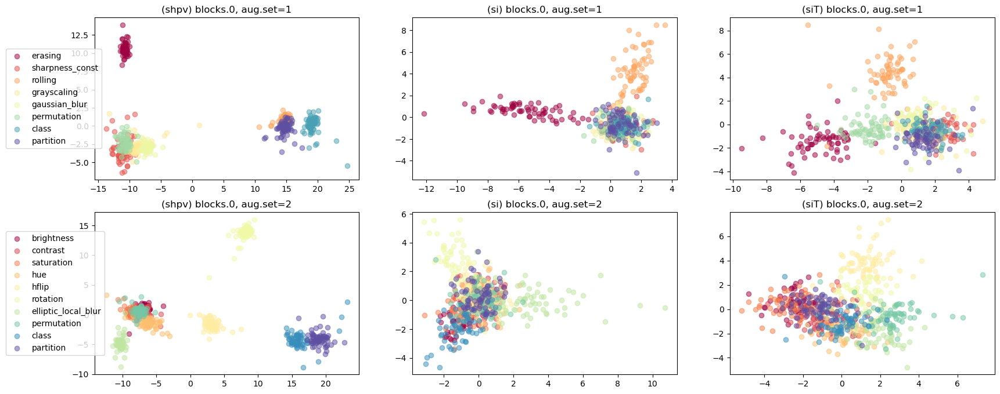

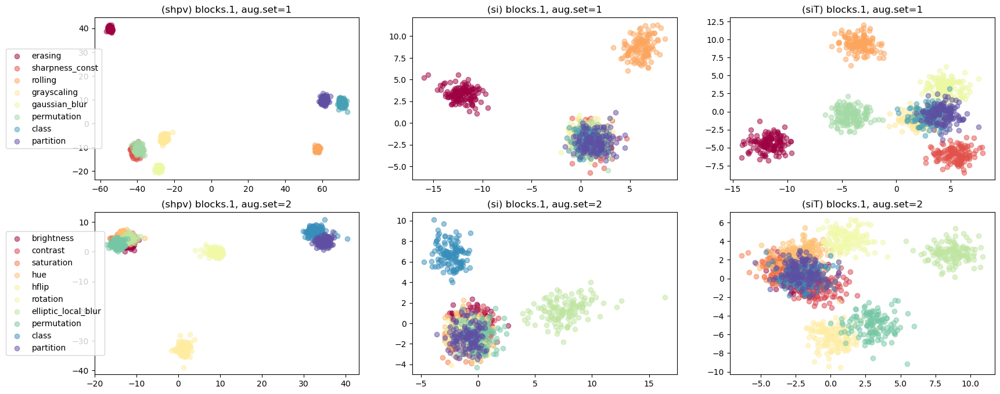

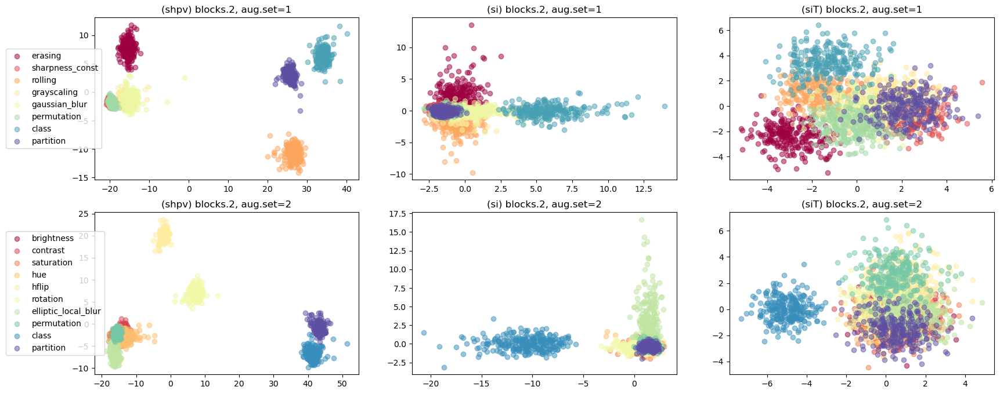

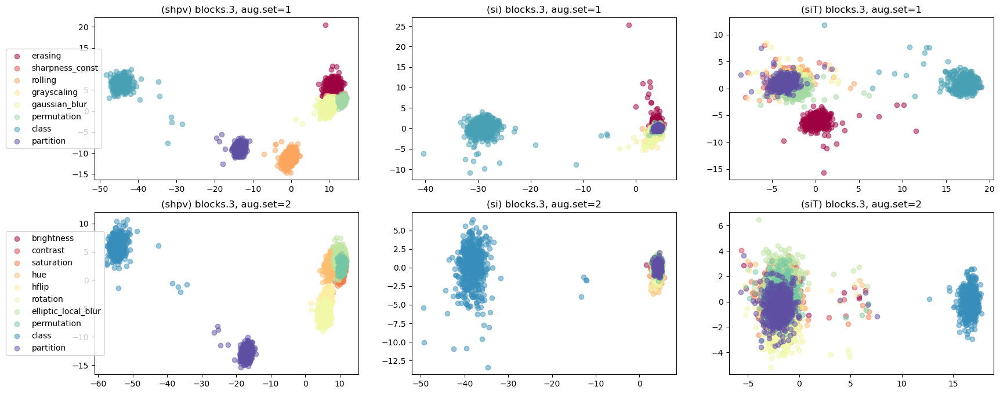

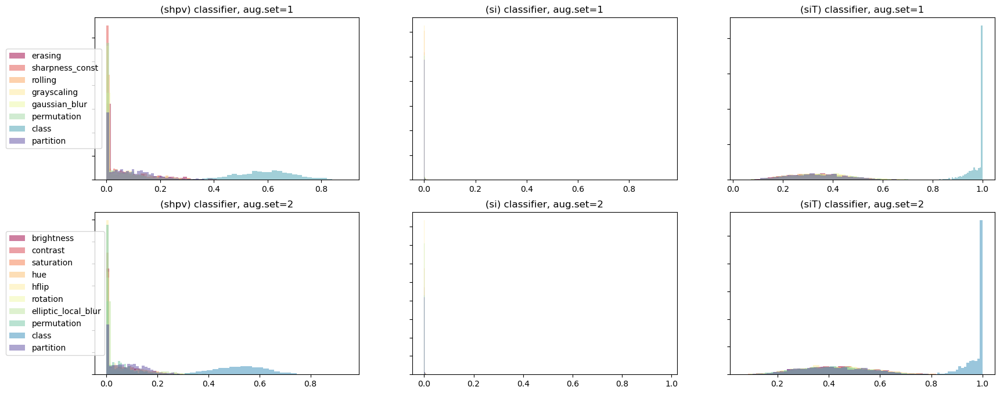

In [14]:
discriminant_analysis.plot.plot_lda_2d_projections_and_hists(
    maxvit_t_projected_sensitivity_values_dict,
    maxvit_t_sensitivity_values_dict,
    maxvit_t_network_modules,
    augmentation_set_numbers_list,
    values_names,
    maxvit_t_n_non_fc_modules,
    extract_auxilliary_names=True,
    figsize=figsize_lda,
    cmap='Spectral',
    show=True,
    alpha=0.5,
)

### 3.3 LDA confusion matrices

[[$\leftarrow$Prev.subsect.]](#3.2-2D-LDA-projections)$\quad$[[Back to section]](#3.-MaxViT-t)$\quad$

In [15]:
maxvit_t_conf_mat_dict, maxvit_t_conf_mat_std_dict, maxvit_t_acc_dict = (
    discriminant_analysis.compute.compute_mean_valid_confusion_matrices(
        maxvit_t_sensitivity_values_dict,
        maxvit_t_network_modules,
        augmentation_set_numbers_list,
        values_names,
        maxvit_t_n_non_fc_modules,
        repeated_kfold_n_splits=5,
        repeated_kfold_n_repeats=100,
        random_state=0,
        extract_auxilliary_names=True,
    )
)

In [16]:
maxvit_t_cmacc_filename = 'lda_maxvit_t_imagenet_conf_mat_acc.pkl'
maxvit_t_cmacc_save_path = os.path.join(
    notebook_directory_offset, activations_dirname, maxvit_t_cmacc_filename
)

In [17]:
data_loader.utils.save_pickled_data(
    {
        'maxvit_t_conf_mat_dict': maxvit_t_conf_mat_dict,
        'maxvit_t_conf_mat_std_dict': maxvit_t_conf_mat_std_dict,
        'maxvit_t_acc_dict': maxvit_t_acc_dict,
    },
    maxvit_t_cmacc_save_path
)

In [34]:
tmp = data_loader.utils.load_pickled_data(maxvit_t_cmacc_save_path)
maxvit_t_conf_mat_dict = tmp['maxvit_t_conf_mat_dict']
maxvit_t_conf_mat_std_dict = tmp['maxvit_t_conf_mat_std_dict']
maxvit_t_acc_dict = tmp['maxvit_t_acc_dict']


			blocks.0



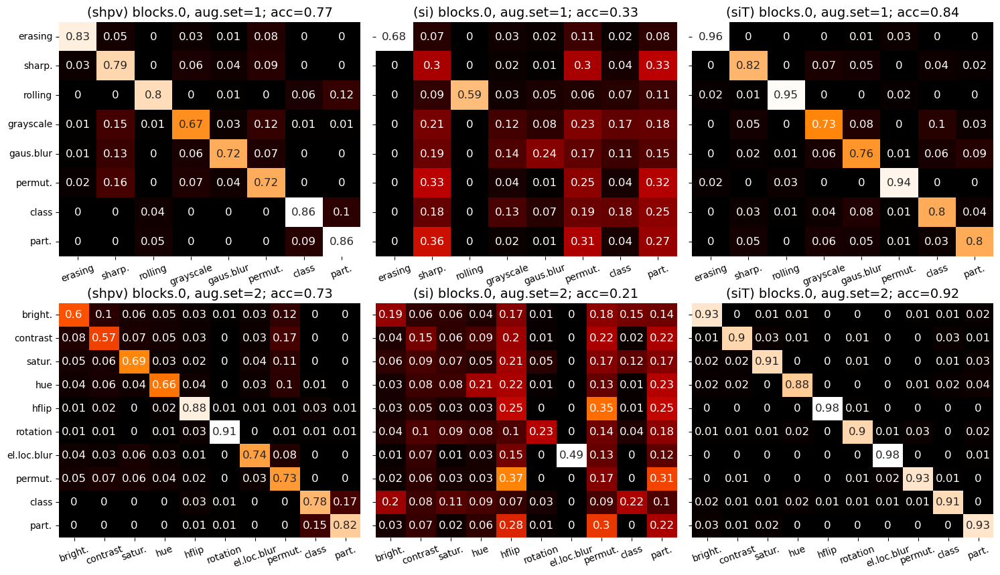


			blocks.1



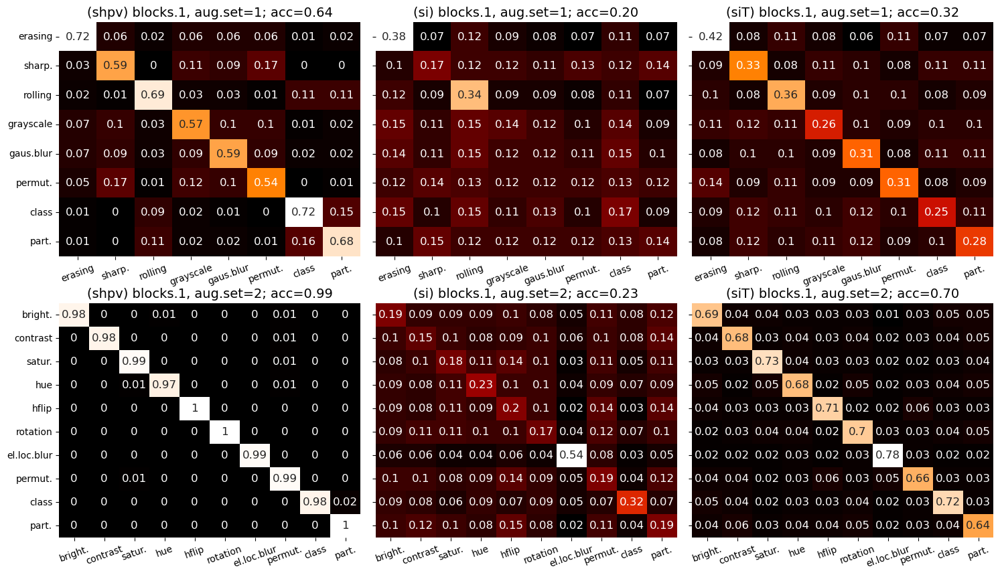


			blocks.2



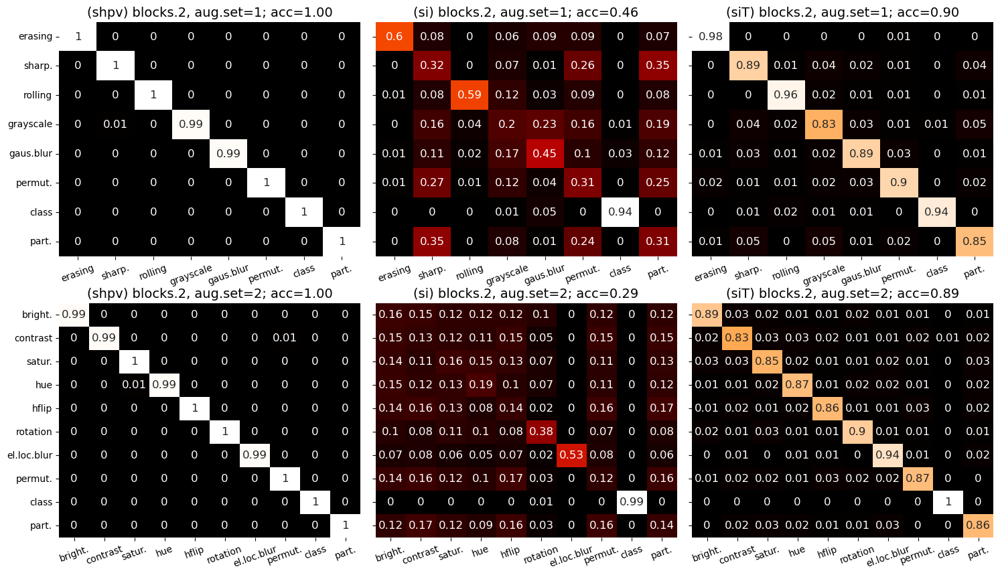


			blocks.3



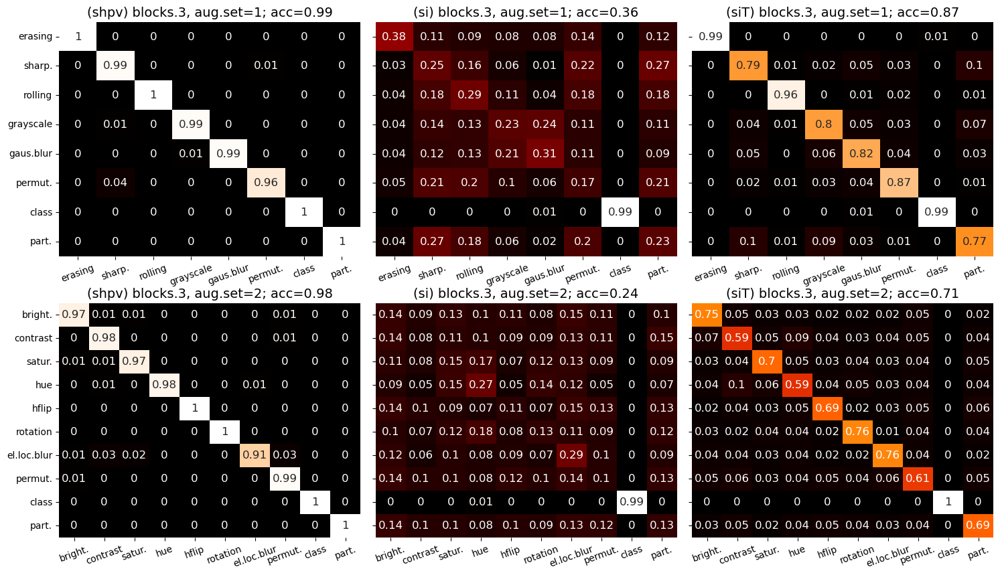

In [18]:
save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{maxvit_t_network_name}_{dataset_name}/lda_confmat/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'lda_confmat'

discriminant_analysis.plot.plot_confusion_matrices(
    maxvit_t_conf_mat_dict,
    maxvit_t_acc_dict,
    maxvit_t_network_modules,
    augmentation_set_numbers_list,
    values_names,
    maxvit_t_n_non_fc_modules,
    extract_auxilliary_names=True,
    which='valid',
    n_round=2,
    figsize=(18, 10),
    cmap='gist_heat',
    show=True,
    save_dirname=save_dirname,
    save_filename_base=save_filename_base,
    text_size=12,
    title_size=14
)


			blocks.0



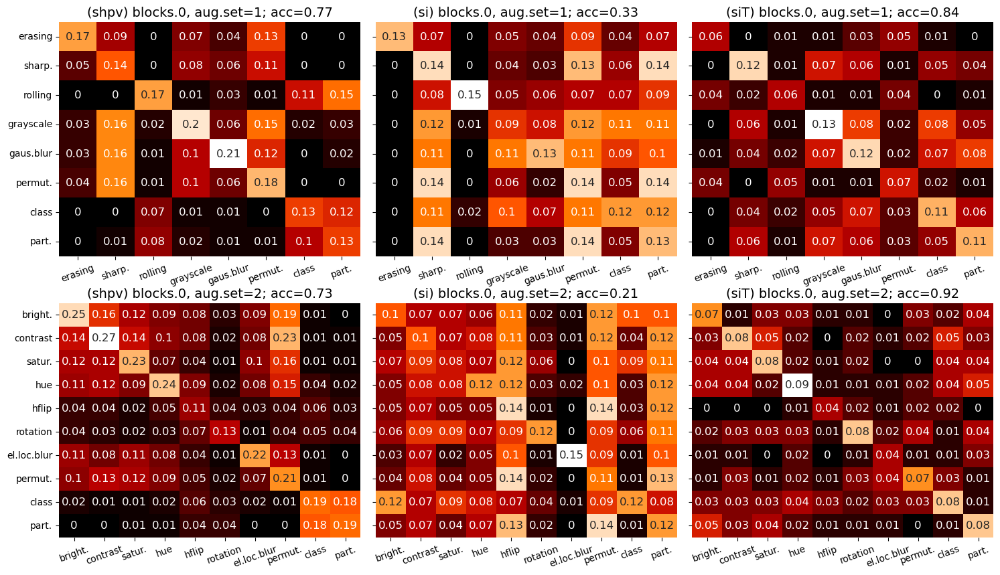


			blocks.1



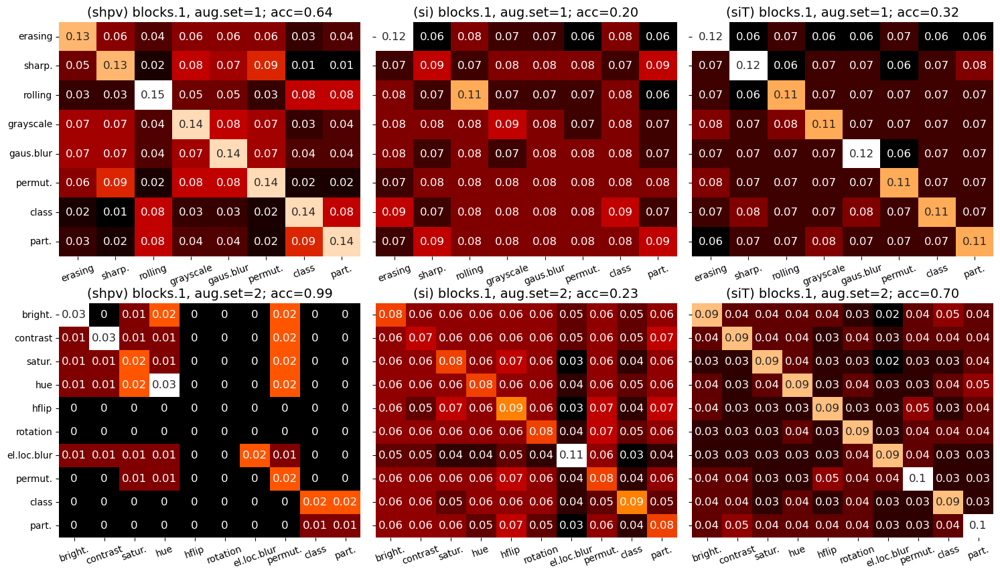


			blocks.2



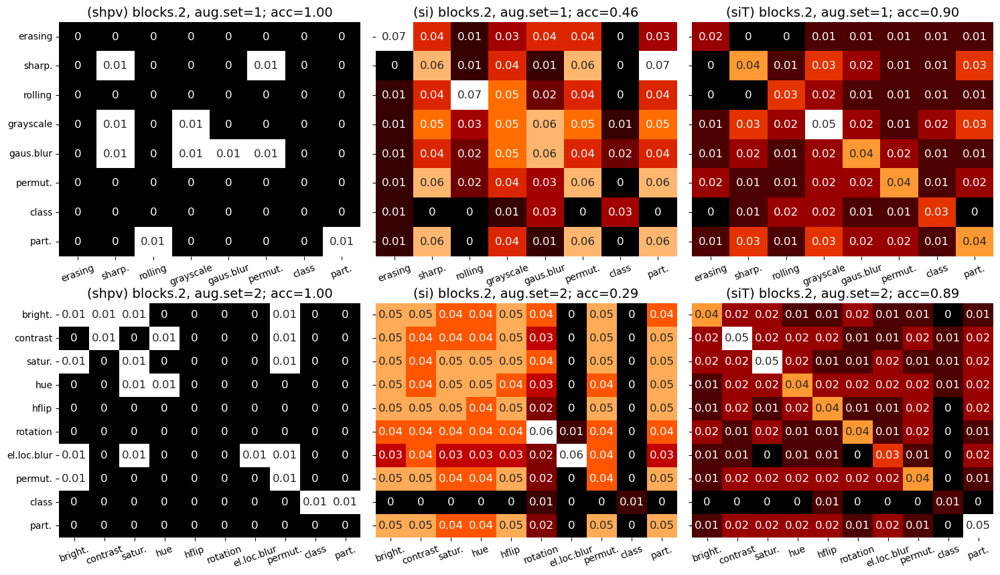


			blocks.3



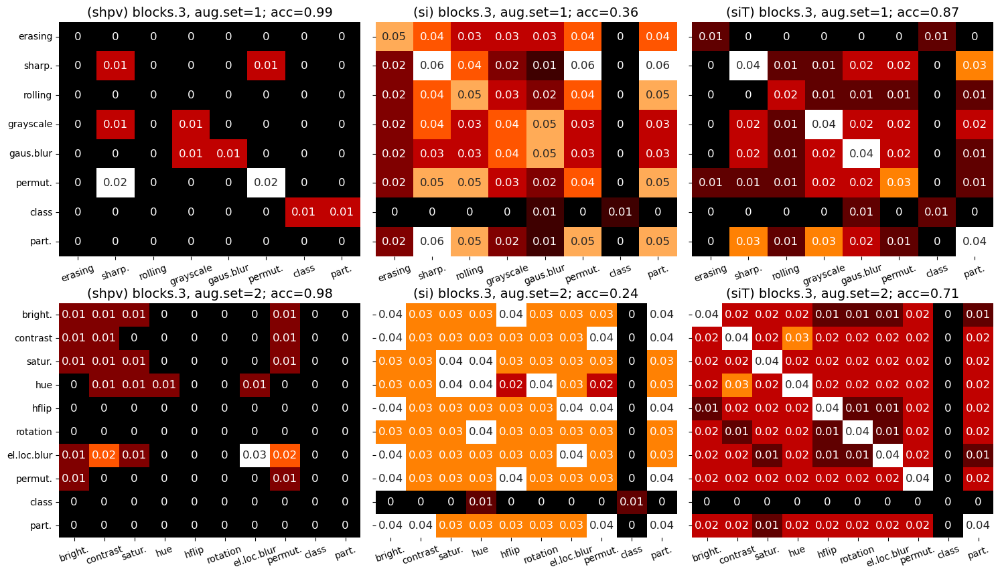

In [19]:
save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{maxvit_t_network_name}_{dataset_name}/lda_confmat_std/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'lda_confmat_std'

discriminant_analysis.plot.plot_confusion_matrices(
    maxvit_t_conf_mat_std_dict,
    maxvit_t_acc_dict,
    maxvit_t_network_modules,
    augmentation_set_numbers_list,
    values_names,
    maxvit_t_n_non_fc_modules,
    extract_auxilliary_names=True,
    which='valid',
    n_round=2,
    figsize=(18, 10),
    cmap='gist_heat',
    show=True,
    save_dirname=save_dirname,
    save_filename_base=save_filename_base,
    text_size=12,
    title_size=14
)

In [21]:
# standard deviation (max stats)
discriminant_analysis.compute.print_max_std_stats(
    maxvit_t_conf_mat_std_dict,
    maxvit_t_network_modules,
    values_names,
    augmentation_set_numbers_list,
    maxvit_t_n_non_fc_modules,
)

Sensitivity=shpv, module=blocks.0, aug.set=1, max(sigma)=0.207
Sensitivity=shpv, module=blocks.0, aug.set=2, max(sigma)=0.266
Sensitivity=shpv, module=blocks.1, aug.set=1, max(sigma)=0.149
Sensitivity=shpv, module=blocks.1, aug.set=2, max(sigma)=0.033
Sensitivity=shpv, module=blocks.2, aug.set=1, max(sigma)=0.010
Sensitivity=shpv, module=blocks.2, aug.set=2, max(sigma)=0.013
Sensitivity=shpv, module=blocks.3, aug.set=1, max(sigma)=0.018
Sensitivity=shpv, module=blocks.3, aug.set=2, max(sigma)=0.028
Sensitivity=shpv: 0.010 <= max(sigma) <= 0.266
Sensitivity=si, module=blocks.0, aug.set=1, max(sigma)=0.152
Sensitivity=si, module=blocks.0, aug.set=2, max(sigma)=0.148
Sensitivity=si, module=blocks.1, aug.set=1, max(sigma)=0.116
Sensitivity=si, module=blocks.1, aug.set=2, max(sigma)=0.107
Sensitivity=si, module=blocks.2, aug.set=1, max(sigma)=0.074
Sensitivity=si, module=blocks.2, aug.set=2, max(sigma)=0.064
Sensitivity=si, module=blocks.3, aug.set=1, max(sigma)=0.059
Sensitivity=si, module